# TASK #1: UNDERSTAND THE PROBLEM STATEMENT AND BUSINESS CASE

![alt text](https://drive.google.com/uc?id=1GAWfaucw0yYWOvVFHCvPUAIe87sqRxAd)

![alt text](https://drive.google.com/uc?id=1zT5SjHQaN0LxV-aSXQuqHFlnTh4iHQmu)

![alt text](https://drive.google.com/uc?id=1e0ZdhUZ-uHYcER1QlgXECT8QqKS7Zq7W)

- Data source: https://www.kaggle.com/mateuszbuda/lgg-mri-segmentation
- Clickable link for the full list of startups in AI medical imagery: https://research.aimultiple.com/looking-for-better-medical-imaging-for-early-diagnostic-and-monitoring-contact-the-leading-vendors-here/

![alt text](https://drive.google.com/uc?id=1l_L8fKJTubEuHl1hvsQgUHLQIW7ha8ua)

![alt text](https://drive.google.com/uc?id=1VzbRzkgsUCLB2gQab5324f6Wy756KtoU)

![alt text](https://drive.google.com/uc?id=1O0LFxybEkdp2wTPJN8PpPHtlJWB9Z0fn)

# IMPORT LIBRARIES AND DATASETS

In [1]:
import pandas as pd
import numpy as np
import seaborn as sns
import matplotlib.pyplot as plt
import zipfile
import cv2
from skimage import io
import tensorflow as tf
from tensorflow.python.keras import Sequential
from tensorflow.keras import layers, optimizers
from tensorflow.keras.applications import DenseNet121
from tensorflow.keras.applications.resnet50 import ResNet50
from tensorflow.keras.layers import *
from tensorflow.keras.models import Model, load_model
from tensorflow.keras.initializers import glorot_uniform
from tensorflow.keras.utils import plot_model
from tensorflow.keras.callbacks import ReduceLROnPlateau, EarlyStopping, ModelCheckpoint, LearningRateScheduler
from IPython.display import display
from tensorflow.keras import backend as K
from sklearn.preprocessing import StandardScaler, normalize
import os
import glob
import random
#from google.colab import files #library to upload files to colab notebook
%matplotlib inline

In [2]:
# You will need to mount your drive using the following commands:
# For more information regarding mounting, please check this out: https://stackoverflow.com/questions/46986398/import-data-into-google-colaboratory

#from google.colab import drive
#drive.mount('/content/drive')

In [3]:
# Navigate to My Drive directory to store the dataset
%cd E:/DataScience/Udemy/tfc/Healthcare_AI_Datasets/Brain_MRI


E:\DataScience\Udemy\tfc\Healthcare_AI_Datasets\Brain_MRI


In [4]:
# data containing path to Brain MRI and their corresponding mask
brain_df = pd.read_csv('data_mask.csv')

![alt text](https://drive.google.com/uc?id=1Surtfp9XVt-anBuK6g5g7IeU1yirVH_1)

In [5]:
brain_df.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 3929 entries, 0 to 3928
Data columns (total 4 columns):
 #   Column      Non-Null Count  Dtype 
---  ------      --------------  ----- 
 0   patient_id  3929 non-null   object
 1   image_path  3929 non-null   object
 2   mask_path   3929 non-null   object
 3   mask        3929 non-null   int64 
dtypes: int64(1), object(3)
memory usage: 122.9+ KB


In [6]:
brain_df.head(2)

,patient_id,image_path,mask_path,mask
0,TCGA_CS_5395_19981004,TCGA_CS_5395_19981004/TCGA_CS_5395_19981004_1.tif,TCGA_CS_5395_19981004/TCGA_CS_5395_19981004_1_...,0
1,TCGA_CS_5395_19981004,TCGA_CS_4944_20010208/TCGA_CS_4944_20010208_1.tif,TCGA_CS_4944_20010208/TCGA_CS_4944_20010208_1_...,0


In [7]:
brain_df.mask_path[1] # Path to the segmentation mask 

'TCGA_CS_4944_20010208/TCGA_CS_4944_20010208_1_mask.tif'

In [8]:
brain_df.image_path[1] # Path to the brain MRI image

'TCGA_CS_4944_20010208/TCGA_CS_4944_20010208_1.tif'

In [9]:
brain_df['mask'].value_counts() # Imbalanced Dataset

0    2556
1    1373
Name: mask, dtype: int64

#  PERFORM DATA VISUALIZATION

In [10]:
brain_df

,patient_id,image_path,mask_path,mask
0,TCGA_CS_5395_19981004,TCGA_CS_5395_19981004/TCGA_CS_5395_19981004_1.tif,TCGA_CS_5395_19981004/TCGA_CS_5395_19981004_1_...,0
1,TCGA_CS_5395_19981004,TCGA_CS_4944_20010208/TCGA_CS_4944_20010208_1.tif,TCGA_CS_4944_20010208/TCGA_CS_4944_20010208_1_...,0
2,TCGA_CS_5395_19981004,TCGA_CS_4941_19960909/TCGA_CS_4941_19960909_1.tif,TCGA_CS_4941_19960909/TCGA_CS_4941_19960909_1_...,0
3,TCGA_CS_5395_19981004,TCGA_CS_4943_20000902/TCGA_CS_4943_20000902_1.tif,TCGA_CS_4943_20000902/TCGA_CS_4943_20000902_1_...,0
4,TCGA_CS_5395_19981004,TCGA_CS_5396_20010302/TCGA_CS_5396_20010302_1.tif,TCGA_CS_5396_20010302/TCGA_CS_5396_20010302_1_...,0
...,...,...,...,...
3924,TCGA_DU_6401_19831001,TCGA_HT_A61B_19991127/TCGA_HT_A61B_19991127_86...,TCGA_HT_A61B_19991127/TCGA_HT_A61B_19991127_86...,0
3925,TCGA_DU_6401_19831001,TCGA_HT_A61A_20000127/TCGA_HT_A61A_20000127_87...,TCGA_HT_A61A_20000127/TCGA_HT_A61A_20000127_87...,0
3926,TCGA_DU_6401_19831001,TCGA_HT_A61B_19991127/TCGA_HT_A61B_19991127_87...,TCGA_HT_A61B_19991127/TCGA_HT_A61B_19991127_87...,0
3927,TCGA_DU_6401_19831001,TCGA_HT_A61A_20000127/TCGA_HT_A61A_20000127_88...,TCGA_HT_A61A_20000127/TCGA_HT_A61A_20000127_88...,0


In [11]:
brain_df['mask'].value_counts().index

Int64Index([0, 1], dtype='int64')

In [12]:
# Use plotly to plot interactive bar chart
import plotly.graph_objects as go

fig = go.Figure([go.Bar(x = brain_df['mask'].value_counts().index, y = brain_df['mask'].value_counts())])
fig.update_traces(marker_color = 'rgb(0,200,0)', marker_line_color = 'rgb(0,255,0)',
                  marker_line_width = 7, opacity = 0.6)
fig.show()

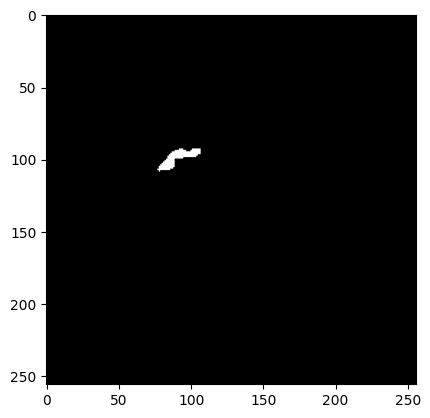

In [13]:
# Sample Mask image -  index of 623
plt.imshow(cv2.imread(brain_df.mask_path[623]))

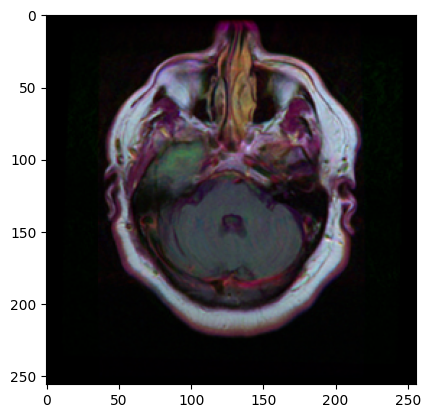

In [14]:
# Sample Original image -  index of 623
plt.imshow(cv2.imread(brain_df.image_path[623]))

In [15]:
cv2.imread(brain_df.mask_path[623]).max()

255

In [16]:
cv2.imread(brain_df.mask_path[623]).min()

0

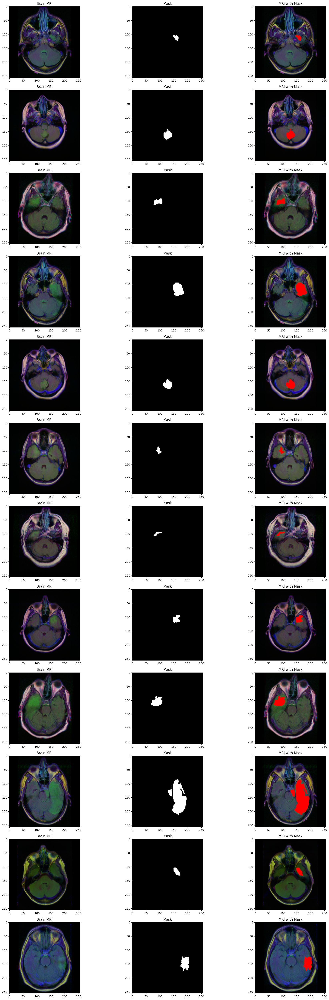

In [17]:
# Advanced Visualization: visualize the MRI scans along with their mask on one image 
count = 0 
fig, axs = plt.subplots(12,3, figsize=(20,50))
for i in range(len(brain_df)):
  if brain_df['mask'][i] == 1 and count < 12:
  # read the images 
    img = io.imread(brain_df.image_path[i])
    # img = cv2.cvtColor(img, cv2.COLOR_BGR2RGB)
    axs[count][0].title.set_text("Brain MRI")
    axs[count][0].imshow(img)

    # obtain the mask for the image 
    mask = io.imread(brain_df.mask_path[i])
    axs[count][1].title.set_text("Mask")
    axs[count][1].imshow(mask, cmap = 'gray')
    
    # replace the values in the image with red color (255,0,0) if any mask pixel in the mask was = 255 
    img[mask == 255] = (255,0,0)    
    axs[count][2].title.set_text("MRI with Mask")
    axs[count][2].imshow(img)
    count += 1

fig.tight_layout()

# UNDERSTAND THE THEORY AND INTUITION BEHIND CONVOLUTIONAL NEURAL NETWORKS AND RESNETS 

![alt text](https://drive.google.com/uc?id=1t8U50NpbLYLFgrZaEQJlp-_GFJ_iMudZ)

- Feature Extraction and Convolutions: https://setosa.io/ev/image-kernels/
- CNN Visualization: https://www.cs.ryerson.ca/~aharley/vis/conv/flat.html


![alt text](https://drive.google.com/uc?id=14oxDfaeHVlNuzUQDRtAOpbtYYlQ9esuL)

- Link to ResNet paper entitled (Deep Residual Learning for Image Recognition): https://arxiv.org/pdf/1512.03385.pdf

ResNet, short for Residual Networks is a classic neural network used as a backbone for many computer vision tasks. This model was the winner of ImageNet challenge in 2015. The fundamental breakthrough with ResNet was it allowed us to train extremely deep neural networks with 150+layers successfully. Prior to ResNet training very deep neural networks was difficult due to the problem of vanishing gradients.

AlexNet, the winner of ImageNet 2012 and the model that apparently kick started the focus on deep learning had only 8 convolutional layers, the VGG network had 19 and Inception or GoogleNet had 22 layers and ResNet 152 had 152 layers. In this blog we will code a ResNet-50 that is a smaller version of ResNet 152 and frequently used as a starting point for transfer learning.

credit - https://towardsdatascience.com/understanding-and-coding-a-resnet-in-keras-446d7ff84d33

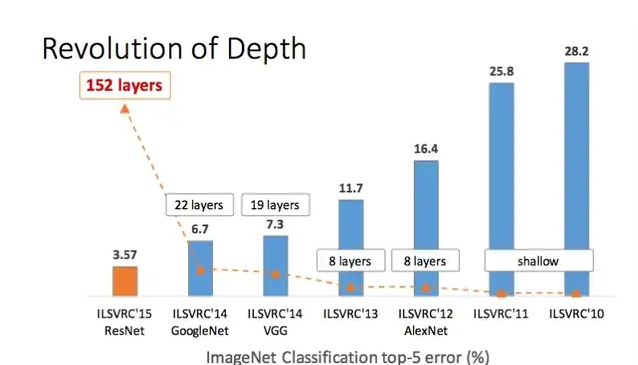

# UNDERSTAND THE THEORY AND INTUITION BEHIND TRANSFER LEARNING

![alt text](https://drive.google.com/uc?id=1CjDpQ-awUrYyQoYFWDEXCECCGhqk46RJ)

![alt text](https://drive.google.com/uc?id=1Vv318FHKynd3neKwIFC5PgFCFwhdBt1s)

![alt text](https://drive.google.com/uc?id=17sRAYegWAOKASMmzoVe0mnNMXJDFc5IP)

- Excellent Resource on transfer learning by Dipanjan Sarkar: https://towardsdatascience.com/a-comprehensive-hands-on-guide-to-transfer-learning-with-real-world-applications-in-deep-learning-212bf3b2f27a
- Article by Jason Brownlee: https://machinelearningmastery.com/transfer-learning-for-deep-learning/

#  TRAIN A CLASSIFIER MODEL TO DETECT IF TUMOR EXISTS OR NOT

In [23]:
# Drop the patient id column
brain_df_train = brain_df.drop(columns = ['patient_id'])
brain_df_train.shape

(3929, 3)

In [24]:
# Convert the data in mask column to string format, to use categorical mode in flow_from_dataframe
# You will get this error message if you comment out the following code line:
# TypeError: If class_mode="categorical", y_col="mask" column values must be type string, list or tuple.
brain_df_train['mask'] = brain_df_train['mask'].apply(lambda x: str(x))

In [25]:
brain_df_train.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 3929 entries, 0 to 3928
Data columns (total 3 columns):
 #   Column      Non-Null Count  Dtype 
---  ------      --------------  ----- 
 0   image_path  3929 non-null   object
 1   mask_path   3929 non-null   object
 2   mask        3929 non-null   object
dtypes: object(3)
memory usage: 92.2+ KB


In [26]:
# split the data into train and test data

from sklearn.model_selection import train_test_split

train, test = train_test_split(brain_df_train, test_size = 0.15)

In [22]:
# create a image generator
from keras_preprocessing.image import ImageDataGenerator

# Create a data generator which scales the data from 0 to 1 and makes validation split of 0.15
datagen = ImageDataGenerator(rescale=1./255., validation_split = 0.15)


In [40]:
train_generator=datagen.flow_from_dataframe(
dataframe=train,
directory= './',
x_col='image_path',
y_col='mask',
subset="training",
batch_size=16,
shuffle=True,
class_mode="categorical",
target_size=(256,256))


valid_generator=datagen.flow_from_dataframe(
dataframe=train,
directory= './',
x_col='image_path',
y_col='mask',
subset="validation",
batch_size=16,
shuffle=True,
class_mode="categorical",
target_size=(256,256))

# Create a data generator for test images
test_datagen=ImageDataGenerator(rescale=1./255.)

test_generator=test_datagen.flow_from_dataframe(
dataframe=test,
directory= './',
x_col='image_path',
y_col='mask',
batch_size=16,
shuffle=False,
class_mode='categorical',
target_size=(256,256))



Found 2839 validated image filenames belonging to 2 classes.
Found 500 validated image filenames belonging to 2 classes.
Found 590 validated image filenames belonging to 2 classes.


In [41]:
# Get the ResNet50 base model
basemodel = ResNet50(weights = 'imagenet', include_top = False, input_tensor = Input(shape=(256, 256, 3)))

In [42]:
basemodel.summary()

Model: "resnet50"
__________________________________________________________________________________________________
 Layer (type)                   Output Shape         Param #     Connected to                     
 input_2 (InputLayer)           [(None, 256, 256, 3  0           []                               
                                )]                                                                
                                                                                                  
 conv1_pad (ZeroPadding2D)      (None, 262, 262, 3)  0           ['input_2[0][0]']                
                                                                                                  
 conv1_conv (Conv2D)            (None, 128, 128, 64  9472        ['conv1_pad[0][0]']              
                                )                                                                 
                                                                                           

In [43]:
# freeze the model weights

for layer in basemodel.layers:
    layers.trainable = False

In [44]:
# Add classification head to the base model

headmodel = basemodel.output
headmodel = AveragePooling2D(pool_size = (4,4))(headmodel)
headmodel = Flatten(name= 'flatten')(headmodel)
headmodel = Dense(256, activation = "relu")(headmodel)
headmodel = Dropout(0.3)(headmodel)#
headmodel = Dense(256, activation = "relu")(headmodel)
headmodel = Dropout(0.3)(headmodel)
#headmodel = Dense(256, activation = "relu")(headmodel)
#headmodel = Dropout(0.3)(headmodel)
headmodel = Dense(2, activation = 'softmax')(headmodel)

model = Model(inputs = basemodel.input, outputs = headmodel)

In [45]:
model.summary()

Model: "model_1"
__________________________________________________________________________________________________
 Layer (type)                   Output Shape         Param #     Connected to                     
 input_2 (InputLayer)           [(None, 256, 256, 3  0           []                               
                                )]                                                                
                                                                                                  
 conv1_pad (ZeroPadding2D)      (None, 262, 262, 3)  0           ['input_2[0][0]']                
                                                                                                  
 conv1_conv (Conv2D)            (None, 128, 128, 64  9472        ['conv1_pad[0][0]']              
                                )                                                                 
                                                                                            

In [47]:
# compile the model

model.compile(loss = 'categorical_crossentropy', optimizer='adam', metrics= ["accuracy"])

In [48]:
# use early stopping to exit training if validation loss is not decreasing even after certain epochs (patience)
earlystopping = EarlyStopping(monitor='val_loss', mode='min', verbose=1, patience=5)

# save the best model with least validation loss
checkpointer = ModelCheckpoint(filepath="classifier-resnet-weights.hdf5", verbose=1, save_best_only=True)

In [38]:
history = model.fit(train_generator, steps_per_epoch= train_generator.n // 16, epochs = 10, validation_data= valid_generator, validation_steps= valid_generator.n // 16, callbacks=[checkpointer, earlystopping])

Epoch 1/10
177/177 [==============================] - ETA: 0s - loss: 0.9049 - accuracy: 0.6805
Epoch 00001: val_loss improved from inf to 7.03276, saving model to classifier-resnet-weights.hdf5


C:\Users\Admin\miniconda3\envs\tensorflow_gpu\lib\site-packages\keras\engine\functional.py:1410: CustomMaskWarning:

Custom mask layers require a config and must override get_config. When loading, the custom mask layer must be passed to the custom_objects argument.



177/177 [==============================] - 63s 277ms/step - loss: 0.9049 - accuracy: 0.6805 - val_loss: 7.0328 - val_accuracy: 0.3427
Epoch 2/10
177/177 [==============================] - ETA: 0s - loss: 0.4617 - accuracy: 0.8133
Epoch 00002: val_loss improved from 7.03276 to 0.64173, saving model to classifier-resnet-weights.hdf5
177/177 [==============================] - 20s 114ms/step - loss: 0.4617 - accuracy: 0.8133 - val_loss: 0.6417 - val_accuracy: 0.6593
Epoch 3/10
177/177 [==============================] - ETA: 0s - loss: 0.3742 - accuracy: 0.8424
Epoch 00003: val_loss did not improve from 0.64173
177/177 [==============================] - 20s 110ms/step - loss: 0.3742 - accuracy: 0.8424 - val_loss: 0.7567 - val_accuracy: 0.6593
Epoch 4/10
177/177 [==============================] - ETA: 0s - loss: 0.3460 - accuracy: 0.8523
Epoch 00004: val_loss did not improve from 0.64173
177/177 [==============================] - 20s 111ms/step - loss: 0.3460 - accuracy: 0.8523 - val_loss: 0

In [ ]:
# save the model architecture to json file for future use

model_json = model.to_json()
with open("classifier-resnet-model.json","w") as json_file:
    json_file.write(model_json)

# ASSESS TRAINED MODEL PERFORMANCE

In [29]:
# Load pretrained model (instead of training the model for 1+ hours) 
with open('classifier-resnet-model.json', 'r') as json_file:
    json_savedModel= json_file.read()
# load the model  
model = tf.keras.models.model_from_json(json_savedModel)
#model.load_weights('weights.hdf5')
model.compile(loss = 'categorical_crossentropy', optimizer='adam', metrics= ["accuracy"])

In [102]:
# make prediction

test_predict = model.predict(test_generator, steps = test_generator.n // 16, verbose =1)

36/36 [==============================] - 2s 32ms/step


In [103]:
test_predict.shape

(576, 2)

In [104]:
test_predict

array([[0.4993605 , 0.5006395 ],
       [0.49920255, 0.5007974 ],
       [0.49938318, 0.50061685],
       ...,
       [0.4993145 , 0.5006855 ],
       [0.49986368, 0.5001363 ],
       [0.49912447, 0.5008756 ]], dtype=float32)

In [57]:
# since we have used test generator, it limited the images to len(predict), due to batch size
original = np.asarray(test['mask'])[:len(predict)]
len(original)

576

In [58]:
# Obtain the accuracy of the model
from sklearn.metrics import accuracy_score

accuracy = accuracy_score(original, predict)
accuracy

0.984375

<AxesSubplot: >

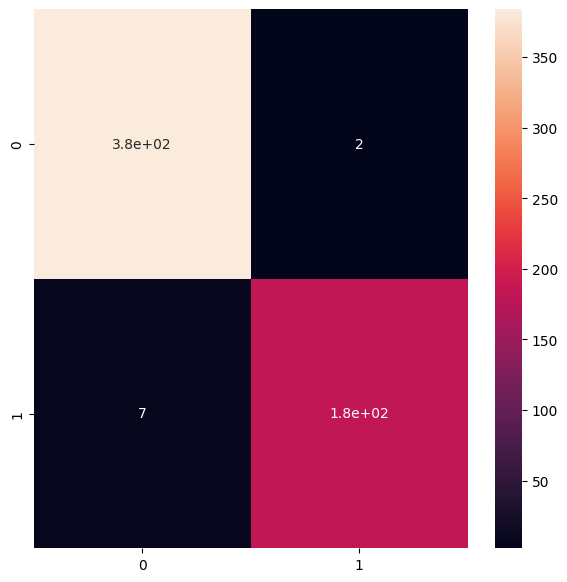

In [59]:
# plot the confusion matrix
from sklearn.metrics import confusion_matrix

cm = confusion_matrix(original, predict)
plt.figure(figsize = (7,7))
sns.heatmap(cm, annot=True)

In [60]:
from sklearn.metrics import classification_report

report = classification_report(original, predict, labels = [0,1])
print(report)

              precision    recall  f1-score   support

           0       0.98      0.99      0.99       386
           1       0.99      0.96      0.98       190

   micro avg       0.98      0.98      0.98       576
   macro avg       0.99      0.98      0.98       576
weighted avg       0.98      0.98      0.98       576



C:\Users\Admin\miniconda3\envs\tensorflow_gpu\lib\site-packages\numpy\lib\arraysetops.py:608: FutureWarning:

elementwise comparison failed; returning scalar instead, but in the future will perform elementwise comparison

C:\Users\Admin\miniconda3\envs\tensorflow_gpu\lib\site-packages\numpy\lib\arraysetops.py:608: FutureWarning:

elementwise comparison failed; returning scalar instead, but in the future will perform elementwise comparison

C:\Users\Admin\miniconda3\envs\tensorflow_gpu\lib\site-packages\numpy\lib\arraysetops.py:608: FutureWarning:

elementwise comparison failed; returning scalar instead, but in the future will perform elementwise comparison

C:\Users\Admin\miniconda3\envs\tensorflow_gpu\lib\site-packages\numpy\lib\arraysetops.py:608: FutureWarning:

elementwise comparison failed; returning scalar instead, but in the future will perform elementwise comparison



# UNDERSTAND THE THEORY AND INTUITION BEHIND RESUNET MODELS

![alt text](https://drive.google.com/uc?id=1WOmTUGT_3oN_ltzWlq9ofsw9E1eJwfwH)

![alt text](https://drive.google.com/uc?id=10XpINWmLDApPhIjxq_o8aTbeRjXIQRTD)

![alt text](https://drive.google.com/uc?id=1cVj4egO9bTOMrnkFDn7RhpysF7jjncQT)

![alt text](https://drive.google.com/uc?id=1p4DnLgrWtO8LEoHE1XhPtk00BIuQIJlt)

![alt text](https://drive.google.com/uc?id=1zULGftqTtOQOOY4y0HfkYSZTcHWkEhXT)

#  BUILD A SEGMENTATION MODEL TO LOCALIZE TUMOR

In [5]:
# Get the dataframe containing MRIs which have masks associated with them.
brain_df_mask = brain_df[brain_df['mask'] == 1]
brain_df_mask.shape

(1373, 4)

In [6]:
# split the data into train and test data

from sklearn.model_selection import train_test_split

X_train, X_val = train_test_split(brain_df_mask, test_size=0.15)
X_test, X_val = train_test_split(X_val, test_size=0.5)

In [7]:
# create separate list for imageId, classId to pass into the generator

train_ids = list(X_train.image_path)
train_mask = list(X_train.mask_path)

val_ids = list(X_val.image_path)
val_mask= list(X_val.mask_path)

In [8]:
# Utilities file contains the code for custom loss function and custom data generator
from utilities import DataGenerator

# create image generators

training_generator = DataGenerator(train_ids,train_mask)
validation_generator = DataGenerator(val_ids,val_mask)

In [9]:
def resblock(X, f):
  

    # make a copy of input
    X_copy = X

    # main path
    # Read more about he_normal: https://medium.com/@prateekvishnu/xavier-and-he-normal-he-et-al-initialization-8e3d7a087528

    X = Conv2D(f, kernel_size = (1,1) ,strides = (1,1),kernel_initializer ='he_normal')(X)
    X = BatchNormalization()(X)
    X = Activation('relu')(X) 

    X = Conv2D(f, kernel_size = (3,3), strides =(1,1), padding = 'same', kernel_initializer ='he_normal')(X)
    X = BatchNormalization()(X)

    # Short path
    # Read more here: https://towardsdatascience.com/understanding-and-coding-a-resnet-in-keras-446d7ff84d33

    X_copy = Conv2D(f, kernel_size = (1,1), strides =(1,1), kernel_initializer ='he_normal')(X_copy)
    X_copy = BatchNormalization()(X_copy)

    # Adding the output from main path and short path together

    X = Add()([X,X_copy])
    X = Activation('relu')(X)

    return X

In [10]:
# function to upscale and concatenate the values passsed
def upsample_concat(x, skip):
    x = UpSampling2D((2,2))(x)
    merge = Concatenate()([x, skip])

    return merge

In [11]:
input_shape = (256,256,3)

# Input tensor shape
X_input = Input(input_shape)

# Stage 1
conv1_in = Conv2D(16,3,activation= 'relu', padding = 'same', kernel_initializer ='he_normal')(X_input)
conv1_in = BatchNormalization()(conv1_in)
conv1_in = Conv2D(16,3,activation= 'relu', padding = 'same', kernel_initializer ='he_normal')(conv1_in)
conv1_in = BatchNormalization()(conv1_in)
pool_1 = MaxPool2D(pool_size = (2,2))(conv1_in)

# Stage 2
conv2_in = resblock(pool_1, 32)
pool_2 = MaxPool2D(pool_size = (2,2))(conv2_in)

# Stage 3
conv3_in = resblock(pool_2, 64)
pool_3 = MaxPool2D(pool_size = (2,2))(conv3_in)

# Stage 4
conv4_in = resblock(pool_3, 128)
pool_4 = MaxPool2D(pool_size = (2,2))(conv4_in)

# Stage 5 (Bottle Neck)
conv5_in = resblock(pool_4, 256)

# Upscale stage 1
up_1 = upsample_concat(conv5_in, conv4_in)
up_1 = resblock(up_1, 128)

# Upscale stage 2
up_2 = upsample_concat(up_1, conv3_in)
up_2 = resblock(up_2, 64)

# Upscale stage 3
up_3 = upsample_concat(up_2, conv2_in)
up_3 = resblock(up_3, 32)

# Upscale stage 4
up_4 = upsample_concat(up_3, conv1_in)
up_4 = resblock(up_4, 16)

# Final Output
output = Conv2D(1, (1,1), padding = "same", activation = "sigmoid")(up_4)

model_seg = Model(inputs = X_input, outputs = output )


In [12]:
model_seg.summary()

Model: "model"
__________________________________________________________________________________________________
 Layer (type)                   Output Shape         Param #     Connected to                     
 input_1 (InputLayer)           [(None, 256, 256, 3  0           []                               
                                )]                                                                
                                                                                                  
 conv2d (Conv2D)                (None, 256, 256, 16  448         ['input_1[0][0]']                
                                )                                                                 
                                                                                                  
 batch_normalization (BatchNorm  (None, 256, 256, 16  64         ['conv2d[0][0]']                 
 alization)                     )                                                             

# TRAIN A SEGMENTATION RESUNET MODEL TO LOCALIZE TUMOR

## Loss function:
 
We need a custom loss function to train this ResUNet.So,  we have used the loss function as it is from https://github.com/nabsabraham/focal-tversky-unet/blob/master/losses.py


@article{focal-unet,
  title={A novel Focal Tversky loss function with improved Attention U-Net for lesion segmentation},
  author={Abraham, Nabila and Khan, Naimul Mefraz},
  journal={arXiv preprint arXiv:1810.07842},
  year={2018}
}

In [13]:
# Utilities file contains the code for custom loss function and custom data generator

from utilities import focal_tversky, tversky_loss, tversky

In [14]:
focal_tversky

<function utilities.focal_tversky(y_true, y_pred)>

In [15]:
# Compile the model
adam = tf.keras.optimizers.Adam(learning_rate = 0.05, epsilon = 0.1)
model_seg.compile(optimizer = adam, loss = focal_tversky, metrics = [tversky])

In [16]:
# use early stopping to exit training if validation loss is not decreasing even after certain epochs (patience)
earlystopping = EarlyStopping(monitor='val_loss', mode='min', verbose=1, patience=20)

# save the best model with lower validation loss
checkpointer = ModelCheckpoint(filepath="ResUNet-weights.hdf5", verbose=30, save_best_only=True)

In [17]:
history = model_seg.fit(training_generator, epochs = 100, validation_data = validation_generator, callbacks = [checkpointer, earlystopping])

Epoch 1/100
72/72 [==============================] - ETA: 0s - loss: 0.8631 - tversky: 0.1776
Epoch 00001: val_loss improved from inf to 0.84772, saving model to ResUNet-weights.hdf5
72/72 [==============================] - 16s 142ms/step - loss: 0.8631 - tversky: 0.1776 - val_loss: 0.8477 - val_tversky: 0.1976


C:\Users\Admin\miniconda3\envs\tensorflow_gpu\lib\site-packages\keras\engine\functional.py:1410: CustomMaskWarning: Custom mask layers require a config and must override get_config. When loading, the custom mask layer must be passed to the custom_objects argument.
  layer_config = serialize_layer_fn(layer)


Epoch 2/100
72/72 [==============================] - ETA: 0s - loss: 0.5741 - tversky: 0.5177
Epoch 00002: val_loss improved from 0.84772 to 0.73178, saving model to ResUNet-weights.hdf5
72/72 [==============================] - 10s 136ms/step - loss: 0.5741 - tversky: 0.5177 - val_loss: 0.7318 - val_tversky: 0.3393
Epoch 3/100
72/72 [==============================] - ETA: 0s - loss: 0.3965 - tversky: 0.7064
Epoch 00003: val_loss improved from 0.73178 to 0.64056, saving model to ResUNet-weights.hdf5
72/72 [==============================] - 10s 143ms/step - loss: 0.3965 - tversky: 0.7064 - val_loss: 0.6406 - val_tversky: 0.4464
Epoch 4/100
72/72 [==============================] - ETA: 0s - loss: 0.3337 - tversky: 0.7669
Epoch 00004: val_loss improved from 0.64056 to 0.48017, saving model to ResUNet-weights.hdf5
72/72 [==============================] - 10s 134ms/step - loss: 0.3337 - tversky: 0.7669 - val_loss: 0.4802 - val_tversky: 0.6236
Epoch 5/100
72/72 [==============================

Epoch 30/100
72/72 [==============================] - ETA: 0s - loss: 0.1110 - tversky: 0.9464
Epoch 00030: val_loss did not improve from 0.17675
72/72 [==============================] - 11s 147ms/step - loss: 0.1110 - tversky: 0.9464 - val_loss: 0.1985 - val_tversky: 0.8810
Epoch 31/100
72/72 [==============================] - ETA: 0s - loss: 0.1118 - tversky: 0.9459
Epoch 00031: val_loss did not improve from 0.17675
72/72 [==============================] - 10s 137ms/step - loss: 0.1118 - tversky: 0.9459 - val_loss: 0.1972 - val_tversky: 0.8847
Epoch 32/100
72/72 [==============================] - ETA: 0s - loss: 0.1071 - tversky: 0.9489
Epoch 00032: val_loss did not improve from 0.17675
72/72 [==============================] - 10s 132ms/step - loss: 0.1071 - tversky: 0.9489 - val_loss: 0.1898 - val_tversky: 0.8899
Epoch 33/100
72/72 [==============================] - ETA: 0s - loss: 0.1061 - tversky: 0.9496
Epoch 00033: val_loss improved from 0.17675 to 0.17396, saving model to ResUN

Epoch 60/100
72/72 [==============================] - ETA: 0s - loss: 0.0763 - tversky: 0.9675
Epoch 00060: val_loss did not improve from 0.17244
72/72 [==============================] - 9s 127ms/step - loss: 0.0763 - tversky: 0.9675 - val_loss: 0.1766 - val_tversky: 0.8999
Epoch 61/100
72/72 [==============================] - ETA: 0s - loss: 0.0762 - tversky: 0.9676
Epoch 00061: val_loss did not improve from 0.17244
72/72 [==============================] - 9s 124ms/step - loss: 0.0762 - tversky: 0.9676 - val_loss: 0.1831 - val_tversky: 0.8945
Epoch 00061: early stopping


In [20]:
# save the model architecture to json file for future use

model_json = model_seg.to_json()
with open("ResUNet-model.json","w") as json_file:
    json_file.write(model_json)

# ASSESS TRAINED SEGMENTATION RESUNET MODEL PERFORMANCE

In [21]:
from utilities import focal_tversky, tversky_loss, tversky

with open('ResUNet-MRI.json', 'r') as json_file:
    json_savedModel= json_file.read()
    
# load the model architecture 
model_seg = tf.keras.models.model_from_json(json_savedModel)
# model_seg.load_weights('weights_seg.hdf5')
model_seg.load_weights('ResUNet-weights.hdf5')
adam = tf.keras.optimizers.Adam(learning_rate = 0.05, epsilon = 0.1)
model_seg.compile(optimizer = adam, loss = focal_tversky, metrics = [tversky])

In [30]:
# Utilities file contains the code for custom loss function and custom data generator
from utilities import prediction

# making prediction
image_id, mask, has_mask = prediction(test, model, model_seg)

In [31]:
# creating a dataframe for the result
df_pred = pd.DataFrame({'image_path': image_id,'predicted_mask': mask,'has_mask': has_mask})
df_pred

,image_path,predicted_mask,has_mask
0,TCGA_HT_7680_19970202/TCGA_HT_7680_19970202_21...,No mask,0
1,TCGA_DU_7300_19910814/TCGA_DU_7300_19910814_13...,"[[[[1.5284259e-06], [8.327342e-07], [1.7340055...",1
2,TCGA_FG_7643_20021104/TCGA_FG_7643_20021104_26...,"[[[[1.920713e-06], [1.1538764e-06], [1.7106914...",1
3,TCGA_HT_A61A_20000127/TCGA_HT_A61A_20000127_79...,No mask,0
4,TCGA_HT_8113_19930809/TCGA_HT_8113_19930809_4.tif,"[[[[2.0375571e-06], [1.0923443e-06], [1.782196...",1
...,...,...,...
585,TCGA_DU_A5TW_19980228/TCGA_DU_A5TW_19980228_27...,"[[[[1.9372471e-06], [8.591763e-07], [1.2045135...",1
586,TCGA_HT_7882_19970125/TCGA_HT_7882_19970125_7.tif,"[[[[1.5156569e-06], [8.011681e-07], [1.6468528...",1
587,TCGA_HT_A61A_20000127/TCGA_HT_A61A_20000127_7.tif,"[[[[1.7271747e-06], [9.351438e-07], [1.7522984...",1
588,TCGA_HT_A61A_20000127/TCGA_HT_A61A_20000127_68...,"[[[[1.956893e-06], [9.328235e-07], [1.3908159e...",1


In [32]:
df_pred['has_mask'].value_counts()

1    426
0    164
Name: has_mask, dtype: int64

In [33]:
# Merge the dataframe containing predicted results with the original test data.
df_pred = test.merge(df_pred, on = 'image_path')
df_pred.head()

,image_path,mask_path,mask,predicted_mask,has_mask
0,TCGA_HT_7680_19970202/TCGA_HT_7680_19970202_21...,TCGA_HT_7680_19970202/TCGA_HT_7680_19970202_21...,0,No mask,0
1,TCGA_DU_7300_19910814/TCGA_DU_7300_19910814_13...,TCGA_DU_7300_19910814/TCGA_DU_7300_19910814_13...,1,"[[[[1.5284259e-06], [8.327342e-07], [1.7340055...",1
2,TCGA_FG_7643_20021104/TCGA_FG_7643_20021104_26...,TCGA_FG_7643_20021104/TCGA_FG_7643_20021104_26...,1,"[[[[1.920713e-06], [1.1538764e-06], [1.7106914...",1
3,TCGA_HT_A61A_20000127/TCGA_HT_A61A_20000127_79...,TCGA_HT_A61A_20000127/TCGA_HT_A61A_20000127_79...,0,No mask,0
4,TCGA_HT_8113_19930809/TCGA_HT_8113_19930809_4.tif,TCGA_HT_8113_19930809/TCGA_HT_8113_19930809_4_...,0,"[[[[2.0375571e-06], [1.0923443e-06], [1.782196...",1


In [34]:
df_pred['mask'].value_counts()

0    386
1    204
Name: mask, dtype: int64

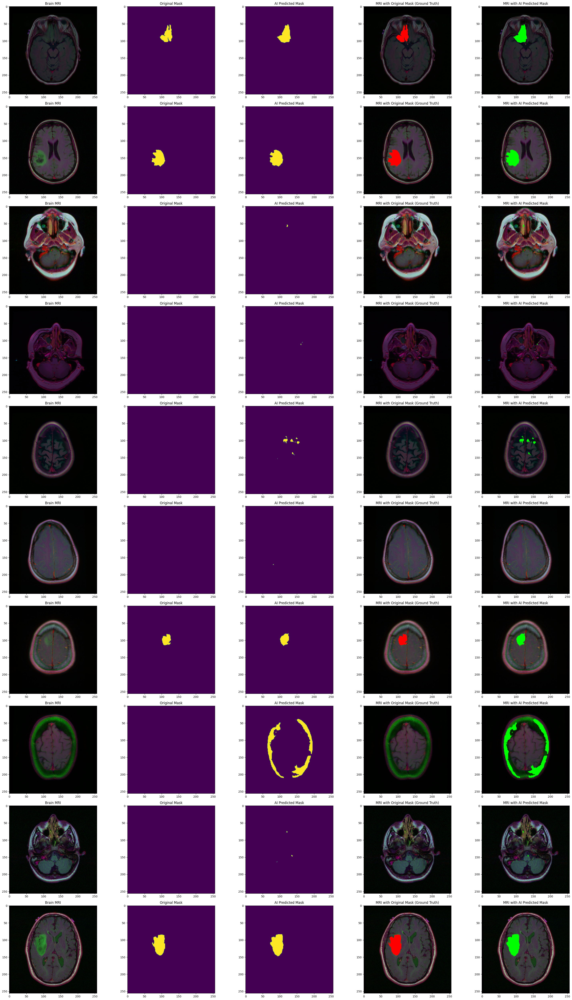

In [35]:
count = 0 
fig, axs = plt.subplots(10, 5, figsize=(30, 50))
for i in range(len(df_pred)):
    if df_pred['has_mask'][i] == 1 and count < 10:
        # read the images and convert them to RGB format
        img = io.imread(df_pred.image_path[i])
        img = cv2.cvtColor(img, cv2.COLOR_BGR2RGB)
        axs[count][0].title.set_text("Brain MRI")
        axs[count][0].imshow(img)

        # Obtain the mask for the image 
        mask = io.imread(df_pred.mask_path[i])
        axs[count][1].title.set_text("Original Mask")
        axs[count][1].imshow(mask)

        # Obtain the predicted mask for the image 
        predicted_mask = np.asarray(df_pred.predicted_mask[i])[0].squeeze().round()
        axs[count][2].title.set_text("AI Predicted Mask")
        axs[count][2].imshow(predicted_mask)

        # Apply the mask to the image 'mask==255'
        img[mask == 255] = (255, 0, 0)
        axs[count][3].title.set_text("MRI with Original Mask (Ground Truth)")
        axs[count][3].imshow(img)

        img_ = io.imread(df_pred.image_path[i])
        img_ = cv2.cvtColor(img_, cv2.COLOR_BGR2RGB)
        img_[predicted_mask == 1] = (0, 255, 0)
        axs[count][4].title.set_text("MRI with AI Predicted Mask")
        axs[count][4].imshow(img_)
        count += 1

fig.tight_layout()